# Домашнее задание №2 - Линейные модели. Градиентный спуск

В этом домашнем задании мы с вами научимся обучать линейные модели регрессии и классификации при помощи очень мощного, но в то же время довольно понятного алгоритма, который называется **градиетный спуск**. Помимо линейных моделей он используется и для обучения самых сложных нейронных сетей! Также мы потренируемся применять готовые реализации линейных моделей для задач регрессии и бинарной классификации.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import random
import pandas as pd

from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
from sklearn.exceptions import NotFittedError
from sklearn.linear_model import (LinearRegression,
                                  LogisticRegression)
from sklearn.datasets import load_boston
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.datasets import make_classification
from sklearn.metrics import (r2_score,
                             mean_squared_error)
from sklearn.model_selection import train_test_split

In [2]:
plt.rcParams["figure.figsize"] = 12, 9
sns.set_style("whitegrid")

SEED = 111
random.seed(SEED)
np.random.seed(SEED)

#### Маленькое теоретическое отступление

Основное свойство антиградиента (-1 * градиент) &ndash; он указывает в сторону наискорейшего убывания функции в данной точке. Соответственно, будет логично стартовать из некоторой точки, сдвинуться в сторону антиградиента, пересчитать антиградиент и снова сдвинуться в его сторону и т.д. Запишем это более формально.

Пусть $w_0$ &ndash; начальный набор параметров (коэффициентов линейной модели) ((например, нулевой или сгенерированный из некоторого, случайного распределения)). Тогда обычный градиентный спуск состоит в повторении следующих шагов до сходимости:


$$
    w_{k + 1} = w_{k} - \eta \nabla_{w} Q(w_{k}),
$$

где $\nabla_{w} Q(w_{k})$ &ndash; градиент функции потерь в точке $w_k$, а $\eta$ &ndash; скорость обучения (learning rate).

Градиентный спуск обычно останавливают, когда прошло заданное максимальное количество итераций или когда графиент близок к нулю (т.е. наши параметры практически не меняются). Для реализации второго варианта считают норму градиента (по сути длину вектора). Это можно сделать несколькими способами:

$$
l1_{norm} = \sum{|w_i|}
$$

$$
l2_{norm} = \sum{(w_i)^{2}}
$$

Попробуем разобраться на простом примере. Рассмотрим функцию от двух переменных:
$f(x, y) = \sin^2 x + \sin^2 y$

In [3]:
def f(w):
    """
    :param w: np.array(np.float) вектор из 2-х элементов
    :return: np.float
    """
    
    return np.sum(np.sin(w)**2)

Обратите внимание, что $x$ - numpy-array вектор длины 2.

***Reminder:***  
Что мы хотим? Мы хотим найти минимум этой функции (в машинном обучении мы обычно хотим найти минимум **функции потерь**, например, MSE), а точнее найти $w_1$ и $w_2$ такие, что при них значение $f(w_1, w_2)$ минимально, то есть *точку экстремума*.  
  
Как мы будем искать эту точку? Используем методы оптимизации (в нашем случае - *минимизации*). Одним из таких методов и является **градиентный спуск**.

### Задание 1. Градиентный спуск для функции $f$ (1 балл)

Реализуйте функцию, которая будет осуществлять градиентный спуск для функции $f$:

*Примечание:* Вам нужно посчитать частные производные именно **аналитически** и **переписать их в код**, а не считать производные численно (через отношение приращения функции к приращению аргумента) -- в этих двух случаях могут различаться ответы, поэтому будьте внимательны.

In [4]:
def grad_f(w): 
    """
    Градиент функциии f, определенной выше.
        :param w: np.array[2]: float вектор из 2-х элементов
        :return: np.array[2]: float вектор из 2-х элементов
    """
    return 2*np.sin(w)*np.cos(w)

In [5]:
X , y = np.asmatrix(np.array([1,2])),f(np.array([1,2])*np.array([1,2]))


In [6]:
def inv(m):
    a, b = m.shape
    if a != b:
        raise ValueError("Only square matrices are invertible.")

    i = np.eye(a, a)
    return np.linalg.lstsq(m, i)[0]

Проверим, что градиент принимает вектор из двух чисел и выдает на этой точке верное значение

In [7]:
assert np.allclose(grad_f(np.array([1, 2])), 
                   np.array([0.90929743, -0.7568025])), "Что-то не так!"

In [8]:
def grad_descent_2d(f, grad_f, lr, num_iter=100, x0=None):
    """
    Функция, которая реализует градиентный спуск в минимум для функции f от двух переменных. 
        :param f: скалярная функция двух переменных
        :param grad_f: функция, возвращающая градиент функции f (устроена как реализованная вами выше grad_f)
        :param lr: learning rate алгоритма
        :param num_iter: количество итераций градиентного спуска
        :return: np.array[num_iter, 2] пар вида (x, f(x))
    """
    
    w0 = np.random.random(2)

    # будем сохранять значения аргументов и значений функции 
    # в процессе град. спуска в переменную history
    history = []

    # итерация цикла == шаг градиентнго спуска
    curr_w = w0.copy()
    for iter_num in range(num_iter):
        entry = np.hstack((curr_w, f(curr_w)))
        history.append(entry)
    
        curr_w -= lr*grad_f(curr_w)#  YOUR CODE. Не забудьте про lr!

    return np.vstack(history)

In [9]:
grad_descent_2d(f, grad_f, 5, num_iter = 100, x0=None)

array([[ 6.12170176e-01,  1.69069754e-01,  3.58530008e-01],
       [-4.09074007e+00, -1.48959289e+00,  1.65425823e+00],
       [ 6.43509800e-01, -6.81123533e-01,  7.56487937e-01],
       [-4.15651454e+00,  4.21053800e+00,  1.49013894e+00],
       [ 3.25860362e-01, -6.78896837e-03,  1.02525458e-01],
       [-2.70691638e+00,  6.10986293e-02,  1.81067757e-01],
       [-6.52647277e+00, -5.48368240e-01,  3.29779107e-01],
       [-4.18846741e+00,  3.90024324e+00,  1.22298558e+00],
       [ 1.43272696e-01, -1.09260414e+00,  8.08626053e-01],
       [-1.26992815e+00,  2.99295881e+00,  9.34106788e-01],
       [ 1.56044534e+00,  4.45750295e+00,  1.93632074e+00],
       [ 1.45694286e+00,  2.01761148e+00,  1.80038674e+00],
       [ 3.28221627e-01,  5.91436941e+00,  2.33884367e-01],
       [-2.72329427e+00,  9.27705531e+00,  1.86667138e-01],
       [-6.43513069e+00,  1.07328848e+01,  9.55477223e-01],
       [-4.93895592e+00,  8.22518003e+00,  1.81796494e+00],
       [-7.12788230e+00,  1.16054596e+01

Визуализируем точки градиентного спуска на 3D-графике нашей функции. Звездочками будут обозначены точки (тройки $w_1, w_2, f(w_1, w_2)$), по которым Ваш алгоритм градиентного спуска двигался к минимуму (Для того, чтобы написовать этот график, мы и сохраняли значения $cur\_w_1, cur\_w_2, f(cur\_w_1, cur\_w_2)$ в `steps` в процессе спуска).

Если у Вас правильно написана функция `grad_descent_2d`, то звездочки на картинке должны сходиться к одной из точек минимума функции. Вы можете менять начальные приближения алгоритма, значения `lr` и `num_iter` и получать разные результаты.

In [10]:
def gradient_desc_vis(f, grad_f, lr=0.1, num_iter=20):
    steps = grad_descent_2d(f, grad_f, lr=lr, num_iter=num_iter)
    
    X, Y = np.meshgrid(np.linspace(-3, 3, 100), np.linspace(-3, 3, 100))

    fig = plt.figure(figsize=(16, 10))
    ax = fig.gca(projection="3d")

    zs = np.array([f(np.array([x,y]))
                  for x, y in zip(np.ravel(X), np.ravel(Y))])
    Z = zs.reshape(X.shape)


    ax.plot_surface(X, Y, Z, cmap=cm.coolwarm, zorder=2)

    ax.plot(xs=steps[:, 0], ys=steps[:, 1], zs=steps[:, 2],
            marker="*", markersize=20, zorder=3, 
            markerfacecolor="y", lw=3, c="black")

    ax.set_zlim(0, 5)
    ax.view_init(elev=60)
    plt.show()
    
    return steps

Gradient descent if etta = 0.1 and number of iterations  = 20


<ipython-input-10-3bc5965c0088>:7: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection="3d")


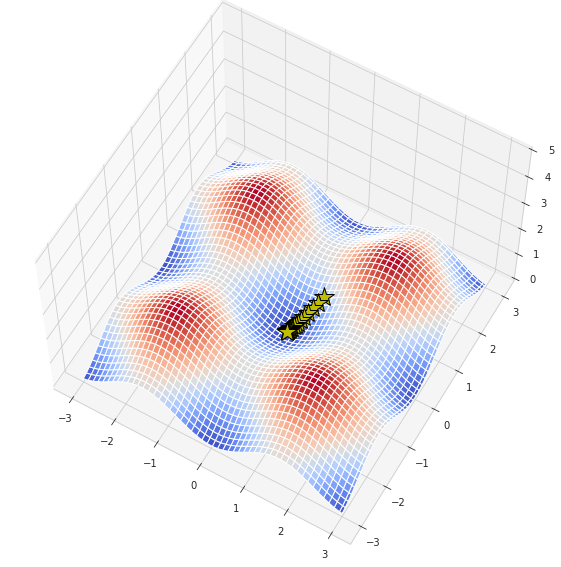

Gradient descent if etta = 0.2 and number of iterations  = 20


<ipython-input-10-3bc5965c0088>:7: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection="3d")


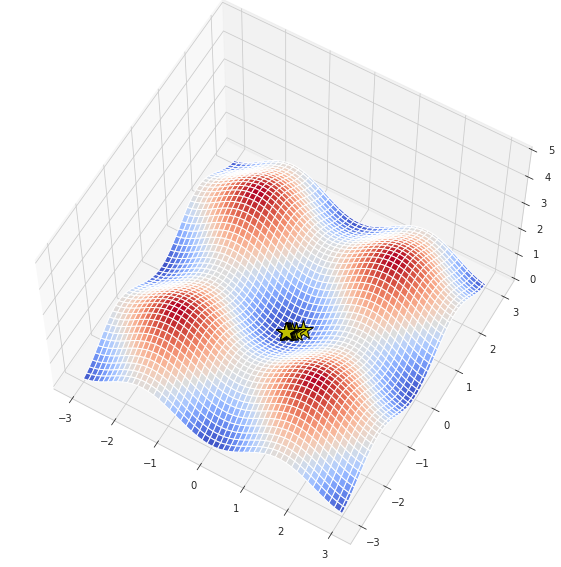

Gradient descent if etta = 0.4 and number of iterations  = 20


<ipython-input-10-3bc5965c0088>:7: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection="3d")


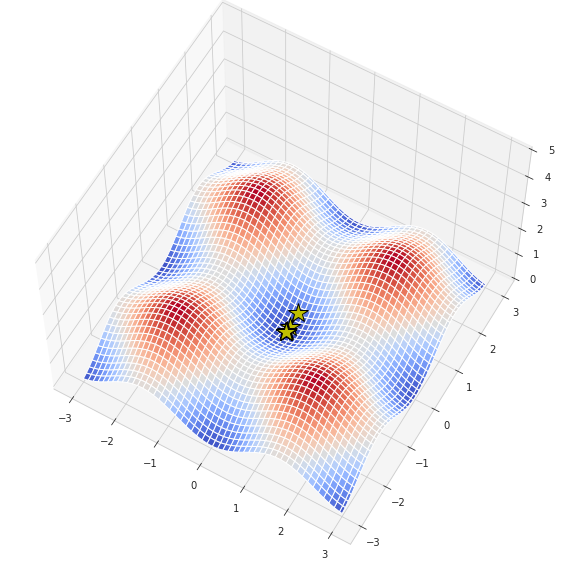

Gradient descent if etta = 0.6 and number of iterations  = 20


<ipython-input-10-3bc5965c0088>:7: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection="3d")


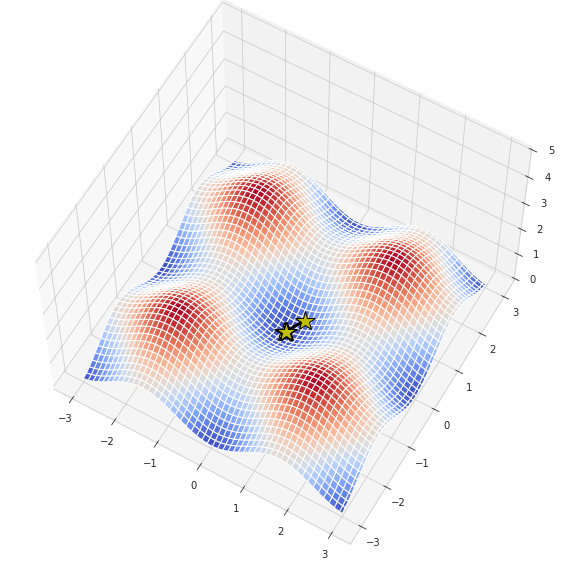

Gradient descent if etta = 0.8 and number of iterations  = 20


<ipython-input-10-3bc5965c0088>:7: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection="3d")


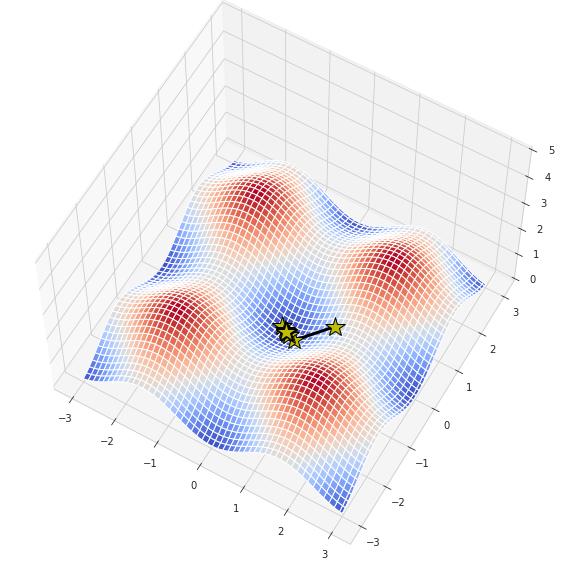

Gradient descent if etta = 1 and number of iterations  = 20


<ipython-input-10-3bc5965c0088>:7: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection="3d")


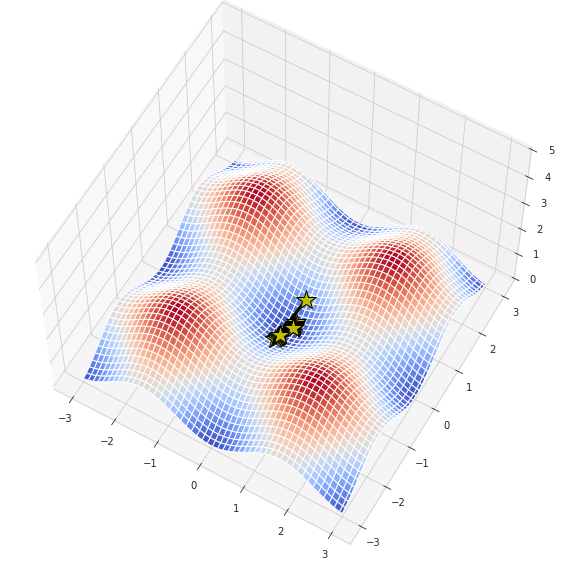

Gradient descent if etta = 0.1 and number of iterations  = 40


<ipython-input-10-3bc5965c0088>:7: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection="3d")


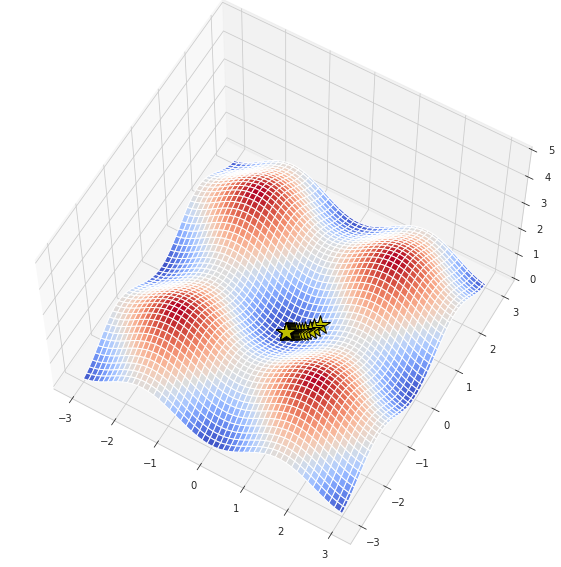

Gradient descent if etta = 0.2 and number of iterations  = 40


<ipython-input-10-3bc5965c0088>:7: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection="3d")


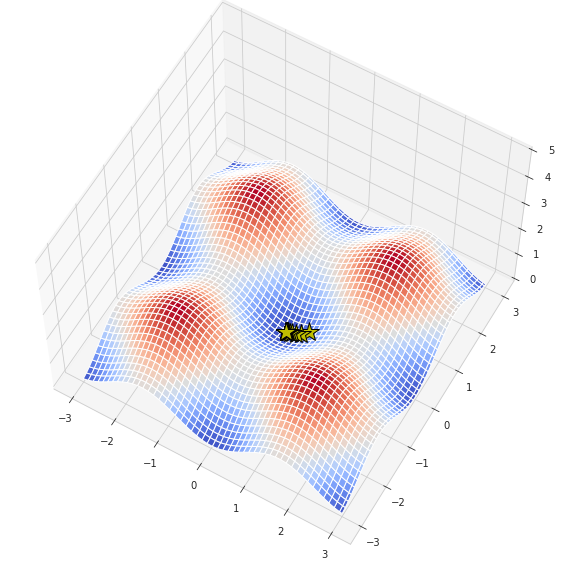

Gradient descent if etta = 0.4 and number of iterations  = 40


<ipython-input-10-3bc5965c0088>:7: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection="3d")


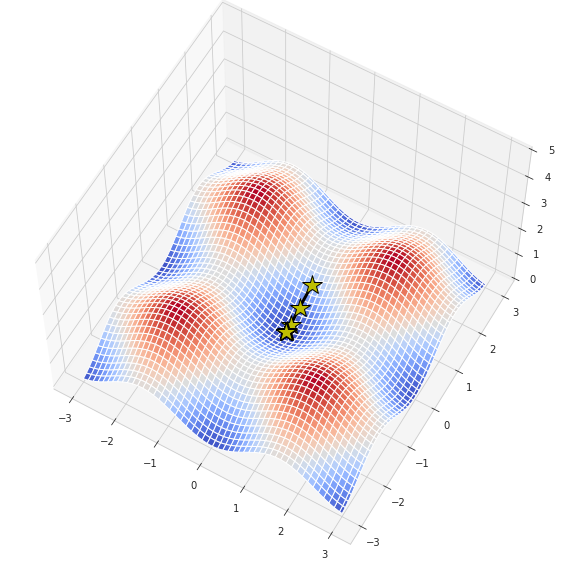

Gradient descent if etta = 0.6 and number of iterations  = 40


<ipython-input-10-3bc5965c0088>:7: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection="3d")


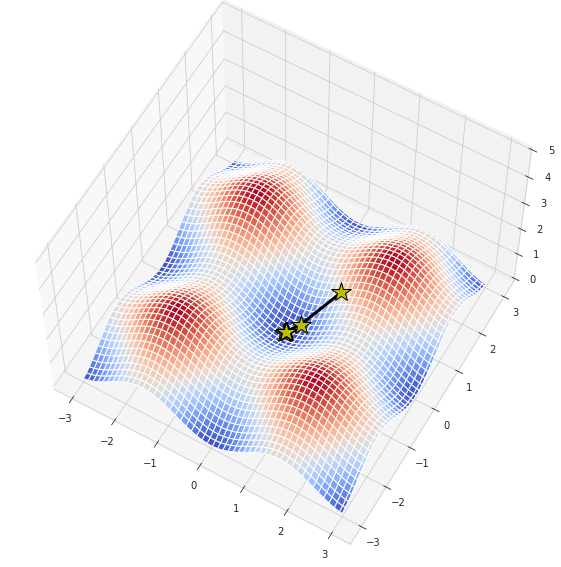

Gradient descent if etta = 0.8 and number of iterations  = 40


<ipython-input-10-3bc5965c0088>:7: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection="3d")


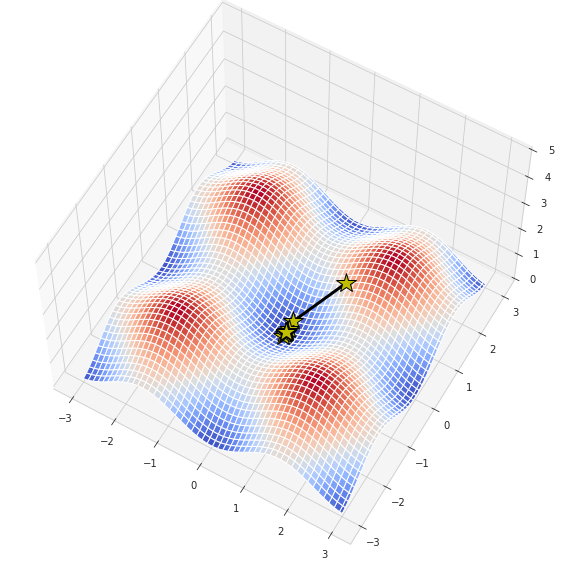

Gradient descent if etta = 1 and number of iterations  = 40


<ipython-input-10-3bc5965c0088>:7: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection="3d")


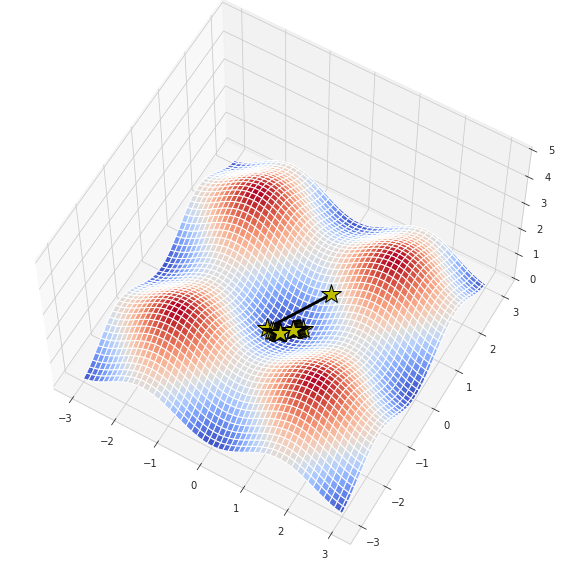

Gradient descent if etta = 0.1 and number of iterations  = 60


<ipython-input-10-3bc5965c0088>:7: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection="3d")


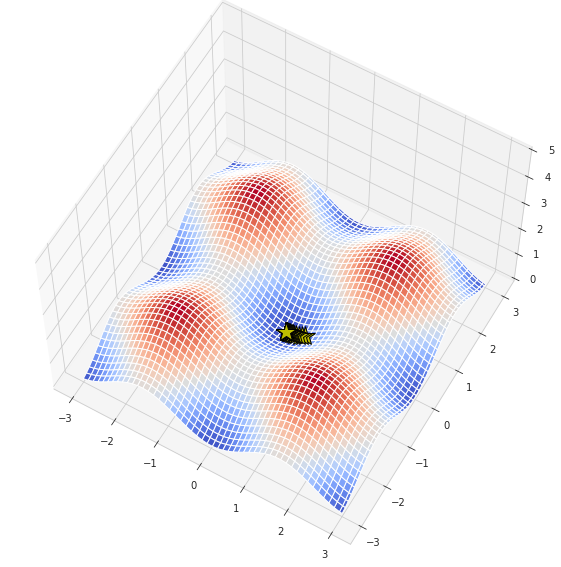

Gradient descent if etta = 0.2 and number of iterations  = 60


<ipython-input-10-3bc5965c0088>:7: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection="3d")


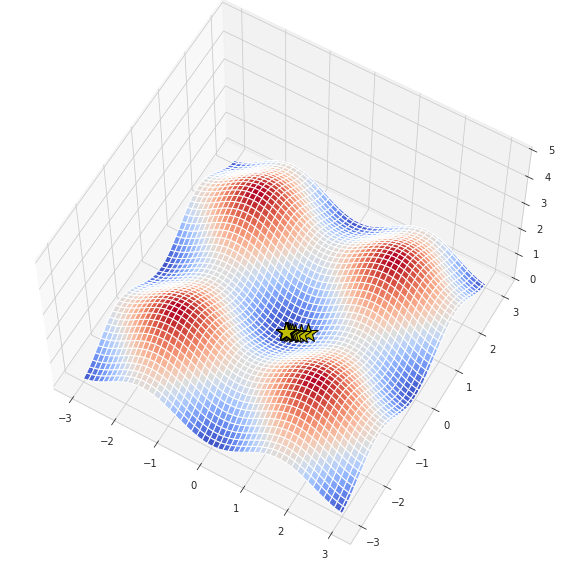

Gradient descent if etta = 0.4 and number of iterations  = 60


<ipython-input-10-3bc5965c0088>:7: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection="3d")


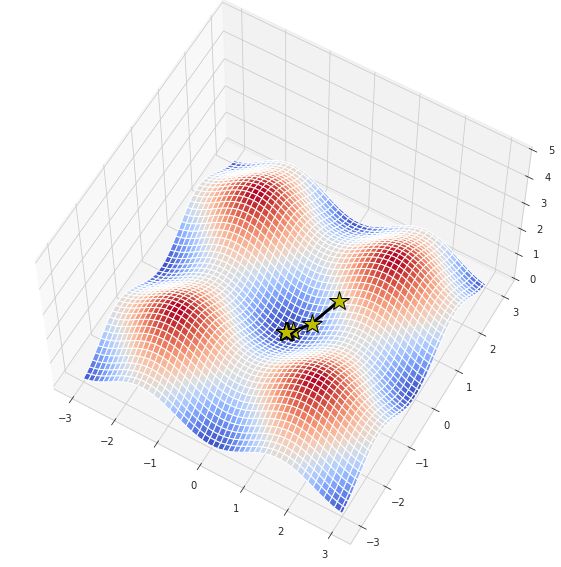

Gradient descent if etta = 0.6 and number of iterations  = 60


<ipython-input-10-3bc5965c0088>:7: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection="3d")


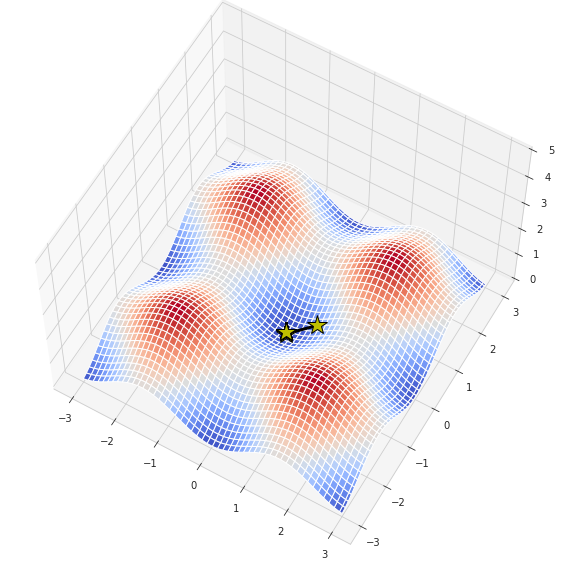

Gradient descent if etta = 0.8 and number of iterations  = 60


<ipython-input-10-3bc5965c0088>:7: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection="3d")


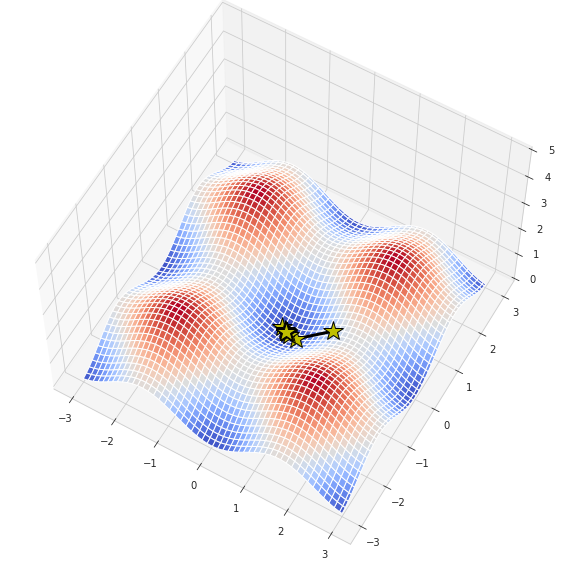

Gradient descent if etta = 1 and number of iterations  = 60


<ipython-input-10-3bc5965c0088>:7: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection="3d")


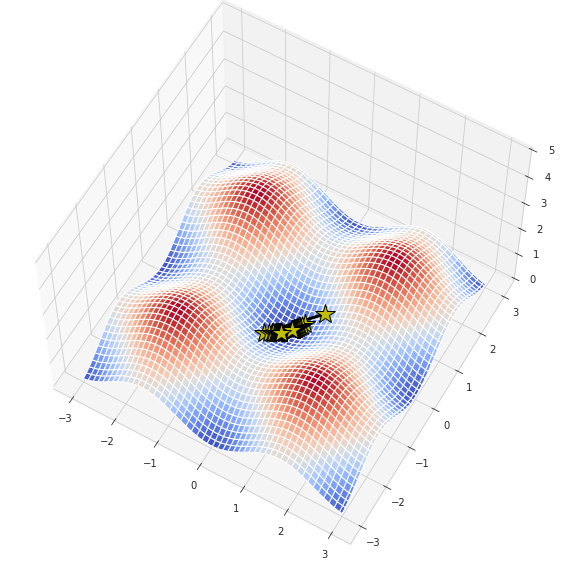

Gradient descent if etta = 0.1 and number of iterations  = 80


<ipython-input-10-3bc5965c0088>:7: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection="3d")


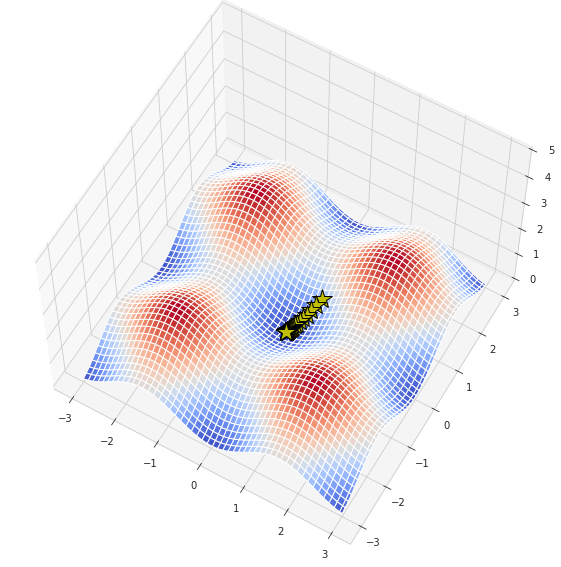

Gradient descent if etta = 0.2 and number of iterations  = 80


<ipython-input-10-3bc5965c0088>:7: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection="3d")


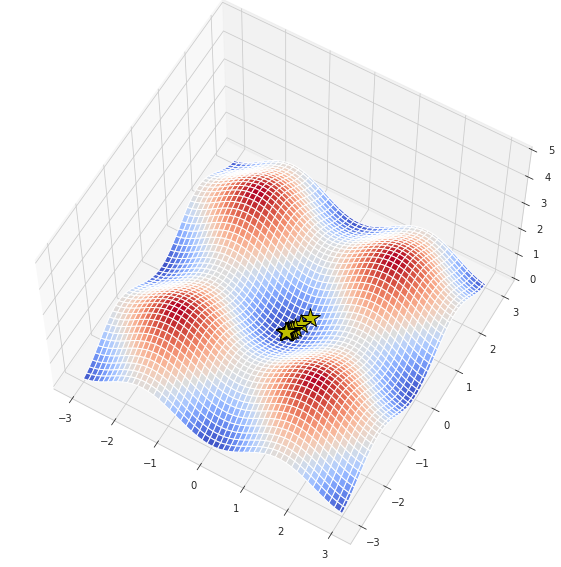

Gradient descent if etta = 0.4 and number of iterations  = 80


<ipython-input-10-3bc5965c0088>:7: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection="3d")


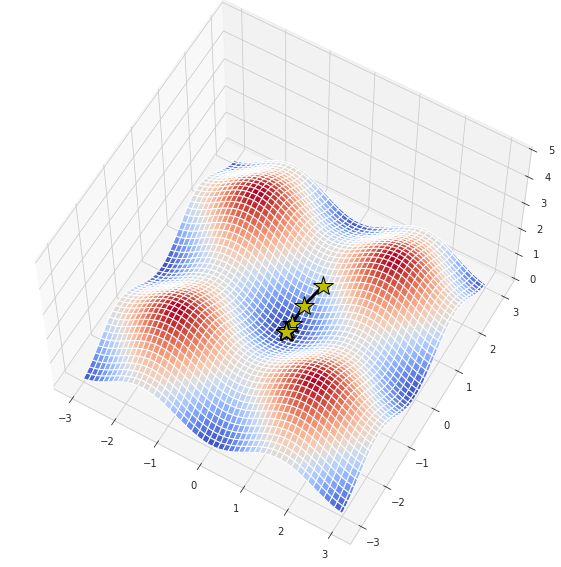

Gradient descent if etta = 0.6 and number of iterations  = 80


<ipython-input-10-3bc5965c0088>:7: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection="3d")


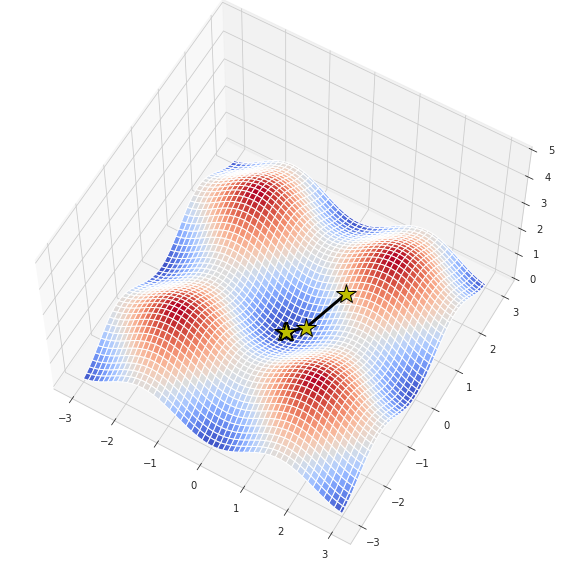

Gradient descent if etta = 0.8 and number of iterations  = 80


<ipython-input-10-3bc5965c0088>:7: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection="3d")


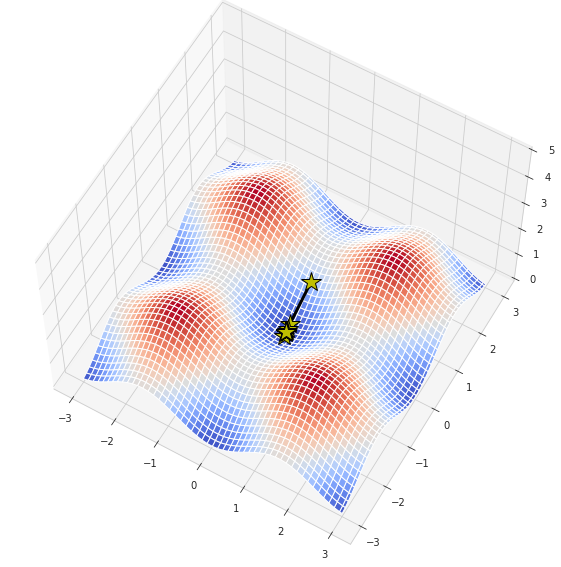

Gradient descent if etta = 1 and number of iterations  = 80


<ipython-input-10-3bc5965c0088>:7: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection="3d")


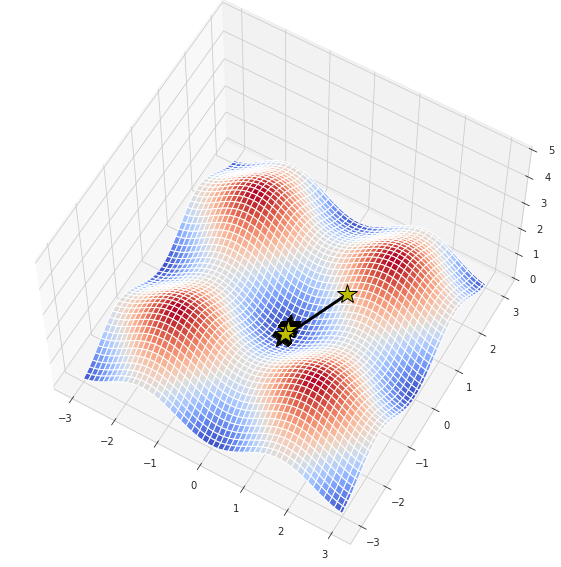

Gradient descent if etta = 0.1 and number of iterations  = 100


<ipython-input-10-3bc5965c0088>:7: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection="3d")


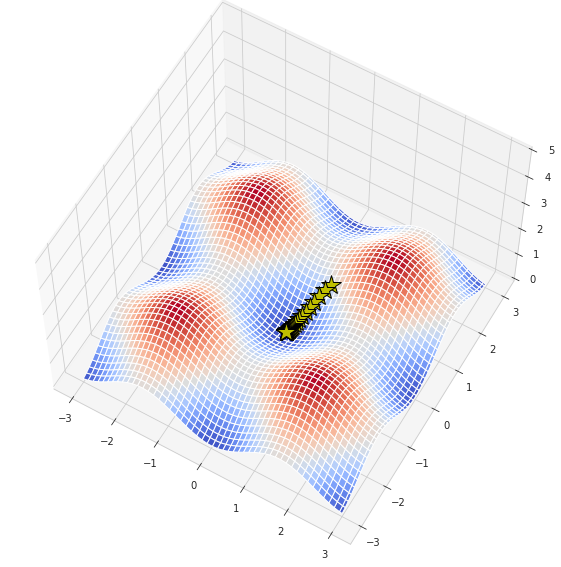

Gradient descent if etta = 0.2 and number of iterations  = 100


<ipython-input-10-3bc5965c0088>:7: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection="3d")


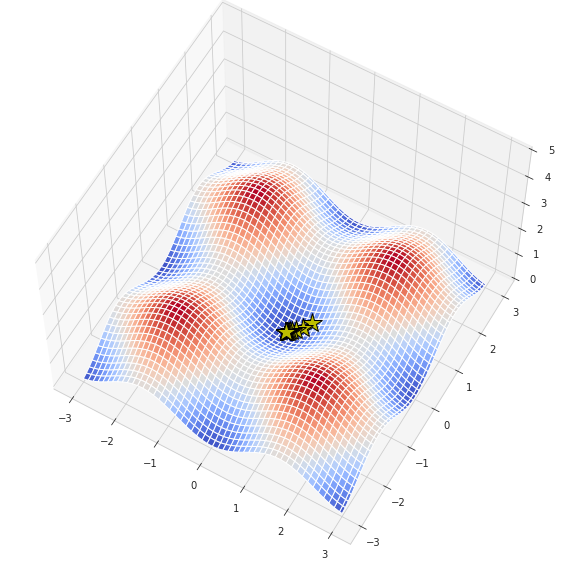

Gradient descent if etta = 0.4 and number of iterations  = 100


<ipython-input-10-3bc5965c0088>:7: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection="3d")


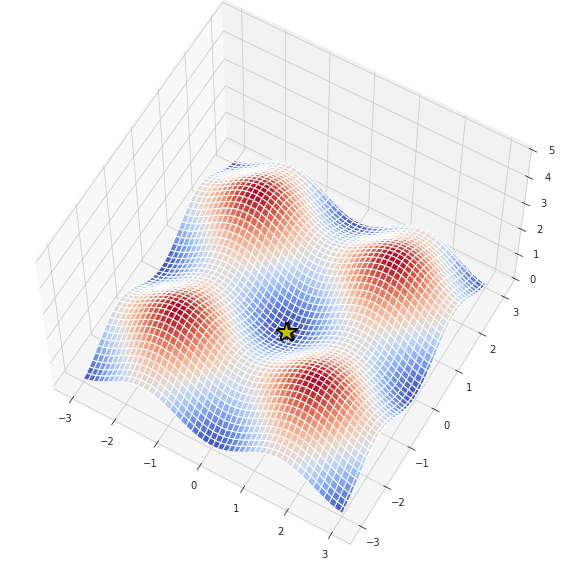

Gradient descent if etta = 0.6 and number of iterations  = 100


<ipython-input-10-3bc5965c0088>:7: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection="3d")


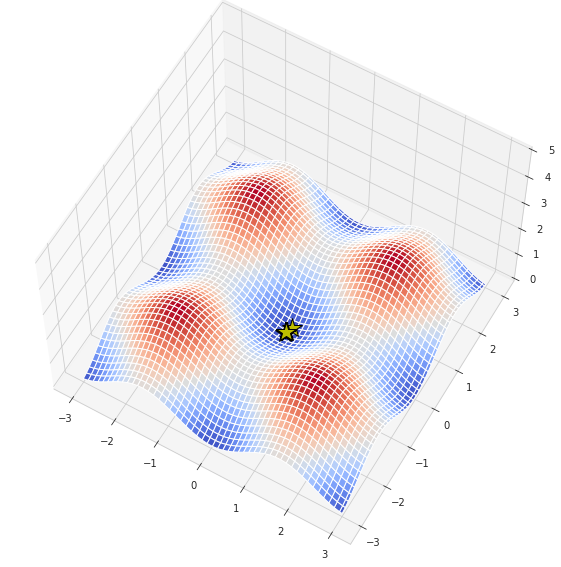

Gradient descent if etta = 0.8 and number of iterations  = 100


<ipython-input-10-3bc5965c0088>:7: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection="3d")


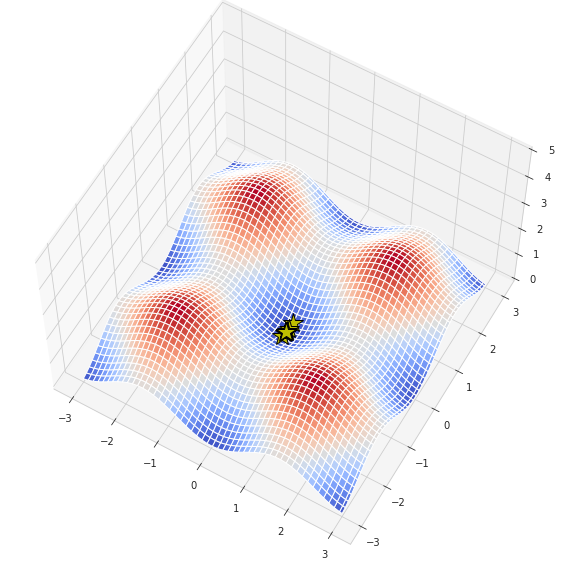

Gradient descent if etta = 1 and number of iterations  = 100


<ipython-input-10-3bc5965c0088>:7: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection="3d")


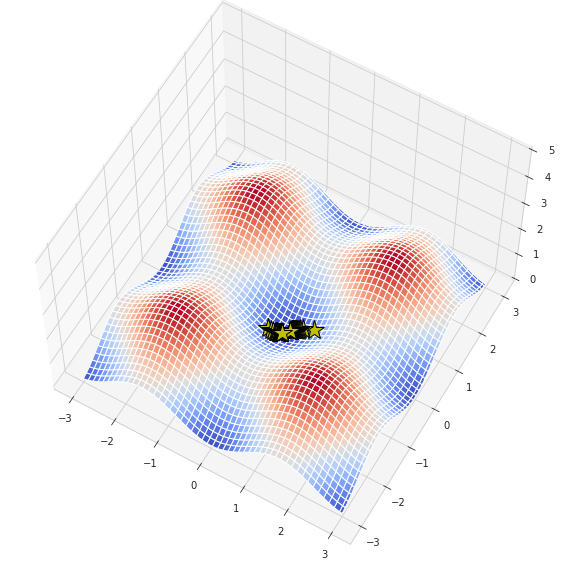

In [11]:
for j in [20,40,60,80,100]:
    for i in [0.1,0.2,0.4,0.6,0.8,1]:
        print(f'Gradient descent if etta = {i} and number of iterations  = {j}')
        steps = gradient_desc_vis(f, grad_f, lr = i, num_iter = j)

#steps = gradient_desc_vis(f, grad_f, lr = 1)

**Как же скорость схождения и траектория изменения функций зависит от шага и количества итераций?**

На графиках можно заметить, что **с увеличением шага** функция становится все дальше от минимума (то есть глубина будет уменьшать точность и специфичность алгоритма предсказания). При шаге 0.1 наша модель **сразу** оказывается в точке экстремума *вне зависимости от количества итераций*. Единственное, на что влияет количество итераций при минимальном шаге - площадь, на которой функция "топчется на месте". 

Если мы рассмотрим более "широкий" шаг, то видим, как с увеличением количества итераций функция от минимума градиентного спуска "отправляется в путь делкий навстречу судьбе". :) 

Посмотрим на зависимость значения функции от шага градиентного спуска.

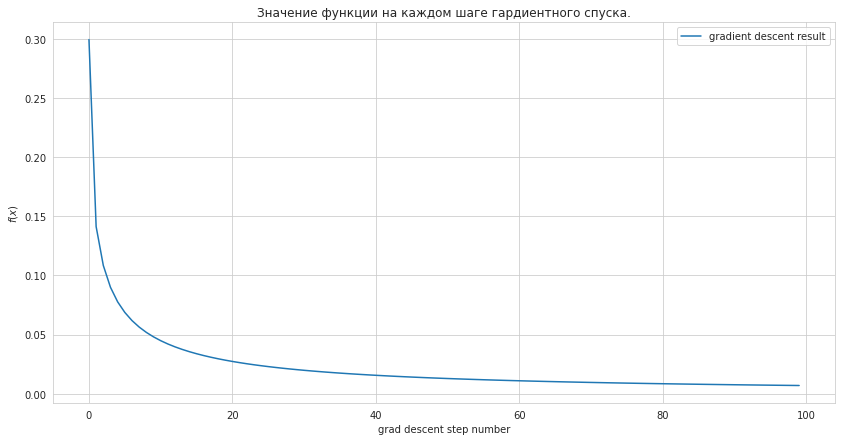

In [12]:
plt.figure(figsize=(14,7))
plt.xlabel("grad descent step number")
plt.ylabel("$f(x)$")
plt.title("Значение функции на каждом шаге гардиентного спуска.")

f_values = list(map(lambda x: x[2], steps))
plt.plot(f_values, label="gradient descent result")
plt.legend();

Любопытно, что уже при минимальном шаге наша функция показывает наибольшую специфичность и точность. При этом без изменения итераций все больший шаг будет держать функцию в экстремуме. 

Таким образом, мы видим, что модель может корректироваться и сильно зависит не только от предела шага (или глубины, в зависимости от модели). В качестве регулирующих параметров могут применяться и количество итераций, и совместное применение параметров. Однако не стоит необдуманно задавать одновременно условия на шаг и количество итераций, так как могут быть получены неожиданно "хорошие" результаты :)

### Задание 2. Реализация линейной регресии (суммарно 9 баллов)

Так как мы будем использовать градиентный спуск для обучения модели, важной часть является реализация функции потерь и функции для расчета ее градиента. Перем началом стоит напомнить, как считать градиент MSE. Вывод этой формулы можно найти  [здесь](https://medium.com/analytics-vidhya/linear-regression-gradient-descent-intuition-and-math-c9a8f5aeeb22)

$$
    MSE = \frac{1}{N}\sum(y_{true} - y_{pred}) ^ 2
$$

$$
    \nabla{MSE} = \frac{2}{N} X^T (y_{pred} - y_{true})
$$

Здесь имеется в виду именно матричное умножение.

#### Задание 2.1. MSE и ее градиент (2 балла)

In [13]:
def mse(y_true, y_pred):
    """
    Функция потерь MSE.
        :param y_true: np.array[n_samples]: вектор из правильных ответов
        :param y_pred: np.array[n_samples]: вектор из предсказаний модели
        :return: значение функции потерь
    """
    
    if  y_true.shape[0] != y_pred.shape[0]:
        raise ValueError("Number of samples in both vectors should be equal")
        
    return (1/y_true.shape[0])*np.square(y_true[:,None] - y_pred).sum(axis = 2).T 


def mse_grad(y_true, y_pred, X):
    """
    Функция для расчета градиента MSE.
        :param y_true: np.array[n_samples]: вектор из правильных ответов
        :param y_pred: np.array[n_samples]: вектор из предсказаний модели
        :param X: np.array[n_samples, n_features]: матрица объекты x признаки
        :return: градиент функции потерь MSE
    """
    
    if  y_true.shape[0] != y_pred.shape[0]:
        raise ValueError("Number of samples in both vectors should be equal")
    # так как у нас предполагается работа с матрицами и .T не работает на эрреях,
    # то переведем Х в матрицу и транспонируем 
    X_tr = np.transpose(np.matrix(X))
    return (2/y_true.shape[0])*(X_tr.dot(np.matrix(np.subtract(y_pred, y_true))))


class MSELoss:
    """
    Класс, реализующий функцию потерь MSE. Нужен для того, чтобы
    объединять в одном месте функцию потерь и градиент для нее.
    """
    
    def __call__(self, y_true, y_pred):
        return mse(y_true, y_pred)
    
    def calculate_gradient(self, y_true, y_pred, X):
        return mse_grad(y_true, y_pred, X)

Мы будем использовать следующий класс для расчета градиента наших функций потерь:

In [14]:
class BasicGradientDescent:
    """
    Класс, позволяющий делать шаги градиентного спуска,
    а также рассчитывающих норму градиента.
    """
    
    def __init__(self, loss_function, grad_norm):
        self.loss = loss_function
        self.grad_norm = grad_norm
        
    
    def step(self, y, y_pred, X):
        grad_i = self.loss.calculate_gradient(y, y_pred, X)
        grad_i_norm = self._calculate_grad_norm(grad_i)
        
        return grad_i, grad_i_norm
            
            
    def _calculate_grad_norm(self, grad_i):
        if self.grad_norm == "l1":
            return np.abs(grad_i).sum()
        elif self.grad_norm == "l2":
            return np.sqrt(np.square(grad_i).sum())
        else:
            raise ValueError(f"I can't calculate {self.grad_norm} norm of gradient")

В данном задании нужно будет реализовать линейную регрессию и обучить ее при помощи градиентного спуска. Для этого нужно будет заполнять пропуски кода в соответствующих классах. Для начала мы реализуем базовый класс для всех линейных моделей, от которого потом будем наследоваться при реализации линейной и логистической регресий. Не переживайте, этот класс уже реализован, вам достостаточно просто разобраться с кодом.

**!ATTENTION: добавленные комментарии - '##'**

In [15]:
class BaseLinearModel:
    """
    Класс, который представляет из себя базовую линейную модель, наследуюясь от которого, мы будем
    реализовывать линейную и логистическую регрессии.
    """
    
    def __init__(self, learning_rate, 
                 loss_function, fit_intercept,
                 n_iter, tol, optimizer, grad_norm):
        """
        Конструктор нашего класса. 
            :param learning_rate: скорость обучения
            :param loss_function: функция потерь (MSE или кросс-энтропия)
            :param fit_intercept: нужно ли нам включать свободный член в модель
            :param n_iter: количество итераций градиентного спуска
            :param tol: параметр для остановки градиентного спуска,
                        если норма градиента (l1 или l2) меньше tol, то останавливаемся
            :param optimizer: класс, который будет рассчитывать градиент и его норму
            :param grad_norm: тип нормы градиента l1 или l2
        """
        
        self.learning_rate = learning_rate
        self.loss = loss_function
        self.fit_intercept = fit_intercept
        self.n_iter = n_iter
        self.tol = tol
        self.grad_norm = grad_norm
        self.optimizer = optimizer(loss_function, grad_norm)
        
        # В начале параметры модели не заданы
        self.W = None
        
        
    def fit(self, X, y):
        """
        Метод для обучения нашей модели 
            :param X: матрица объекты x признаки
            :param y: вектор значений целевой переменной
            :return: обученная модель
        """
        
        # Сделаем из y вектор-столбец (n_samples, 1)
        ## Necessary for matrix-based operations 
        ## !ARRAYS ARE NOT SUPPORTED
        y = y.reshape(-1, 1)
        n_samples = X.shape[0]
        
        # Добавим колонку из 1 в матрицу X
        ## add free participant - for linear model equation,
        ## otherwise SingularMatrix error
        if self.fit_intercept:
            ones_column = np.ones((n_samples, 1))
            X_new = np.hstack((ones_column, X))
        
        n_features = X_new.shape[1]
        
        # Инициализируем веса модели
        if self.W is None:
            self.W = np.random.randn(n_features, 1)
        
        # Обучаем модель градиентным спуском
        for i in range(self.n_iter):
            y_pred = self.predict(X)
            grad_i, grad_i_norm = self.optimizer.step(y, y_pred, X_new)
            
            # Если градиент близок к 0, останавливаемся
            ## But in description we set this condition as strictly less than 0
            ## We avoid the extremum because of the distribution's form of MSE function?
            ## (as it never achieves 0)
            if grad_i_norm < self.tol:
                return self
            
            else:
                self.W -= self.learning_rate * grad_i
        
        return self
    
    
    def predict(self, X):
        raise NotImplementedError("It is a basic class for all linear models. You should implement it for descendant class.")
    
    
    def __repr__(self):
        return "Base linear model without prediction skill :("

#### Задание 2.2. Предсказания линейной регрессии (3 балла)

Реализуйте метод `predict` у класса `CustomLinearRegression`, не забудьте про свободный член!

In [129]:
class CustomLinearRegression(BaseLinearModel):
    def __init__(self, learning_rate: float = 1e-2, ## set format of threshold as float number
                 loss_function=MSELoss(), fit_intercept=True, # set functions and linearity condition
                 n_iter=1000, tol=1e-5, optimizer=BasicGradientDescent, grad_norm="l1"): #by which (previous or next) GD we restrict
        
        # Если вы не проходили наследование и в частности `super`, то не страшно
        # коротко, с помощью этого мы можем вызывать методы родительского класса
        # в частности здесь мы используем метод `init`
        super().__init__(learning_rate=learning_rate, 
                         loss_function=loss_function, fit_intercept=fit_intercept,
                         n_iter=n_iter, tol=tol, optimizer=optimizer, grad_norm=grad_norm)
        
    
    def predict(self, X_test):
        """
        Метод для вычисления предсказаний 
            :param X_test: np.array[n_test_samples, n_features]: 
                           матрица объекты x признаки (тестовый датасет)
            :return: y_pred: np.array[n_test_samples, 1]: предсказания модели
        """
        
        if self.W is None:
            raise NotFittedError("This CustomLinearRegression instance is not fitted yet, run fit method.")
        
        n_test_samples = X_test.shape[0]
        if self.fit_intercept:
            ones_column = np.ones((n_test_samples, 1))
            X_test = np.hstack((ones_column, X_test))
        
        return X_test.dot( self.W )
    
    
    def __repr__(self):
        return "My custom linear regression"

##### Проверим нашу реализацию на простом примере

In [130]:
X = np.random.randn(100, 1)
y = 2 * X + 5 + 0.5 * np.random.randn(100, 1)

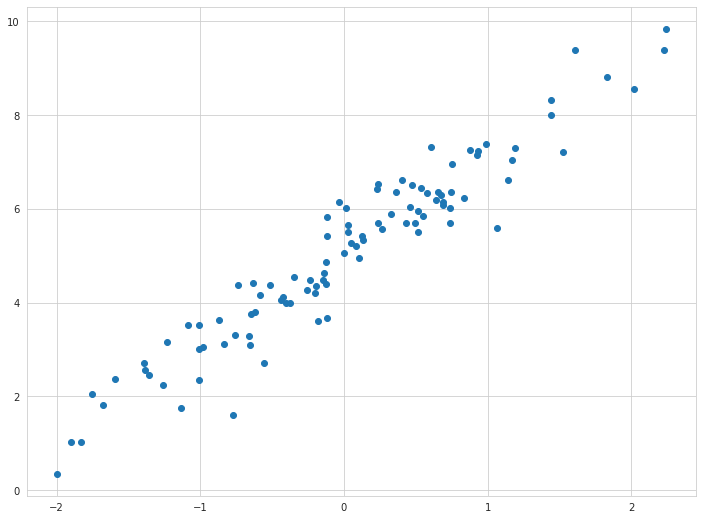

In [131]:
plt.scatter(X, y);

In [132]:
custom_lin_reg = CustomLinearRegression()

In [133]:
custom_lin_reg.fit(X, y)

My custom linear regression

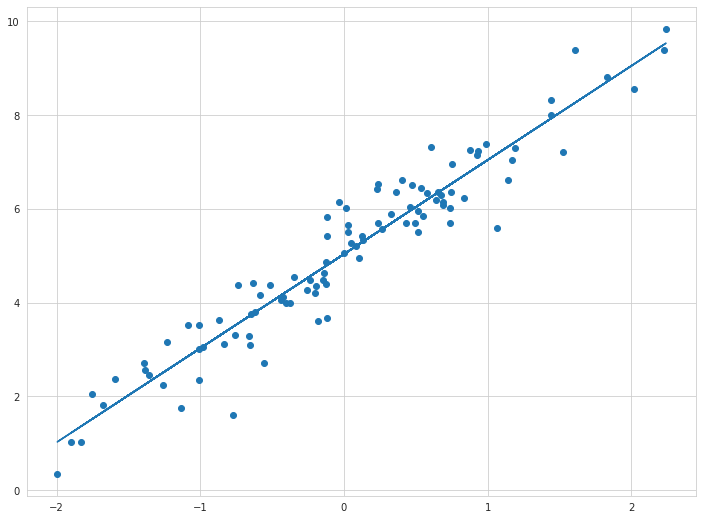

In [134]:
plt.scatter(X, y)
plt.plot(X, custom_lin_reg.predict(X));

#### Задание 2.3. Используем встроенную линейную регрессию (4 балла)

Поработаем с данными о ценах на дома в Бостоне. Постройте модель линейной регресии при помощи `LinearRegression` из `sklearn`. Не забудьте разделить данные на тренировочную и тестовую части, а также правильно предобработать признаки. В конце воспользуйтесь какими-то изученными метриками регресии и сделайте выводы о качестве полученной модели, а также о том, какие признаки наиболее важны с точки зрения полученной модели.

In [135]:
data = load_boston()
X, y = data["data"], data["target"]
feature_names = data["feature_names"]

/home/xeniasu/miniconda3/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function load_boston is deprecated; `load_boston` is deprecated in 1.0 and will be removed in 1.2.

    The Boston housing prices dataset has an ethical problem. You can refer to
    the documentation of this function for further details.

    The scikit-learn maintainers therefore strongly discourage the use of this
    dataset unless the purpose of the code is to study and educate about
    ethical issues in data science and machine learning.

    In this special case, you can fetch the dataset from the original
    source::

        import pandas as pd
        import numpy as np


        data_url = "http://lib.stat.cmu.edu/datasets/boston"
        raw_df = pd.read_csv(data_url, sep="\s+", skiprows=22, header=None)
        data = np.hstack([raw_df.values[::2, :], raw_df.values[1::2, :2]])
        target = raw_df.values[1::2, 2]

    Alternative datasets include the California housing

Ваш ход:

In [136]:
# Analyze data stucture
data_fr = pd.DataFrame(X, index = None)

data_fr.columns = feature_names
#data_fr['target'] = y
data_fr

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33
...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.06263,0.0,11.93,0.0,0.573,6.593,69.1,2.4786,1.0,273.0,21.0,391.99,9.67
502,0.04527,0.0,11.93,0.0,0.573,6.120,76.7,2.2875,1.0,273.0,21.0,396.90,9.08
503,0.06076,0.0,11.93,0.0,0.573,6.976,91.0,2.1675,1.0,273.0,21.0,396.90,5.64
504,0.10959,0.0,11.93,0.0,0.573,6.794,89.3,2.3889,1.0,273.0,21.0,393.45,6.48


In [138]:
# Linear model for whole data:
scaler = StandardScaler()
X_st = scaler.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X_st, y, test_size = 0.33, random_state = 111)


ValueError: x and y must be the same size

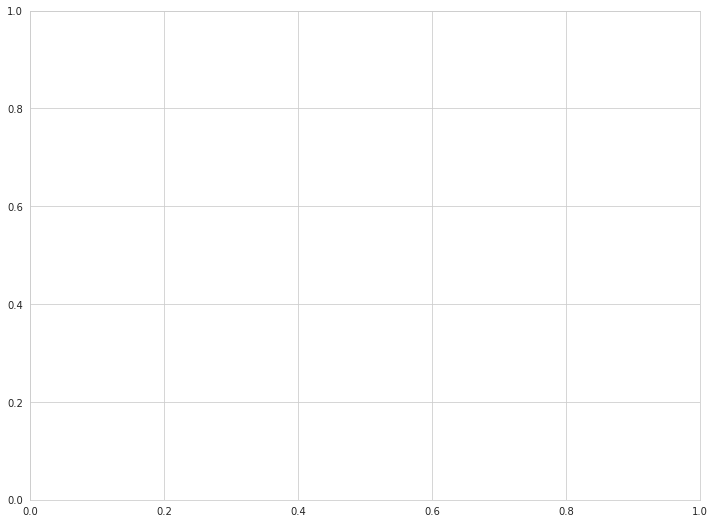

In [140]:
#scaler = StandardScaler()
#X_tr_st = scaler.fit_transform(X_train)
#X_tst_st = scaler.fit_transform(X_test)
lin_m = LinearRegression()
lin_m.fit(X_train, y_train)
data_y_pred = lin_m.predict(X_test)

##!FAILED TO PLOT 'CAUSE OF DIMENSION DIFFERENCE IN TARGET AND TEST SET DATA'
#plt.scatter(X_test, y_test, color="purple")
#plt.plot(X_test, data_y_pred, color="pink", linewidth=1)
#plt.title('Linear regression model of Boston dataset')
#plt.xlabel('Features scores')
#plt.ylabel('Y score')

print(f'R2 score for linear model regression: {r2_score(y_test,lin_m.predict(X_tst_st))}')
print(f'RMSE score for linear model regression: {mean_squared_error(y_test,lin_m.predict(X_tst_st))}')

On the whole data we see, that our model don not predict well. It could predict at about 70% of target variable with about 27 value deviation from the true target values. Lets see, which features could be used for prediction (have the better R2 and MSE scores comparing with the rest of them).

In [141]:
from sklearn.metrics import r2_score, explained_variance_score, mean_squared_error
def all_var_lm(X, y, feature_names):
    """
    
    input:
        X : default arrays of parameters;
        y : default array of target variable;
        feature_names : list of features (parameters) to be analyzed.
    output:
        plots of regression and predictions for each parameters
    
    """
    
    
    # Have to standartize parameters, as dimension and format differ among them
    #scaler = StandardScaler()
    X_st = scaler.fit_transform(X)
    r2_metrics = []
    var_score = []
    mse = []
    # Each parameter should be analyzed separetly on LRM prediction accuracy and correlation with target var
    for v in range(len(feature_names)):
        lrm = LinearRegression() #template for LR
        
        # extact test and train sets from dataset
        X_tr, X_tst, y_tr, y_tst = train_test_split(X_st[:,v].reshape(-1,1), y, test_size=0.33, random_state=111)
        
        # teach a model for one parameter
        lrm.fit(X_tr, y_tr)
        
        # predict y variable for test data
        y_prd = lrm.predict(X_tst)
        
        # estimate quality of model for prediction against feature
        r2_metrics.append(r2_score(y_tst, y_prd))
        var_score.append(explained_variance_score(y_tst, y_prd))
        mse.append(mean_squared_error(y_tst, y_prd))
        
        # visualize results
        plt.scatter(X_tst, y_tst, color="blue")
        plt.plot(X_tst, data_y_pred, color="orange", linewidth=1)
        plt.title(f'Linear regression model for {feature_names[v]}')
        plt.xlabel(f'{feature_names[v]}')
        plt.ylabel('Y score')
        #plt.xticks(())
        #plt.yticks(())
        #plt.set_title(f'Linear regression model for {feature_names[v]}')
        plt.show()
    out = pd.DataFrame([r2_metrics,var_score, mse], columns = list(feature_names))
    out['Parameter'] = ['R2_score', 'Explained_variance', 'MSE']
    return out.set_index('Parameter', drop = True)

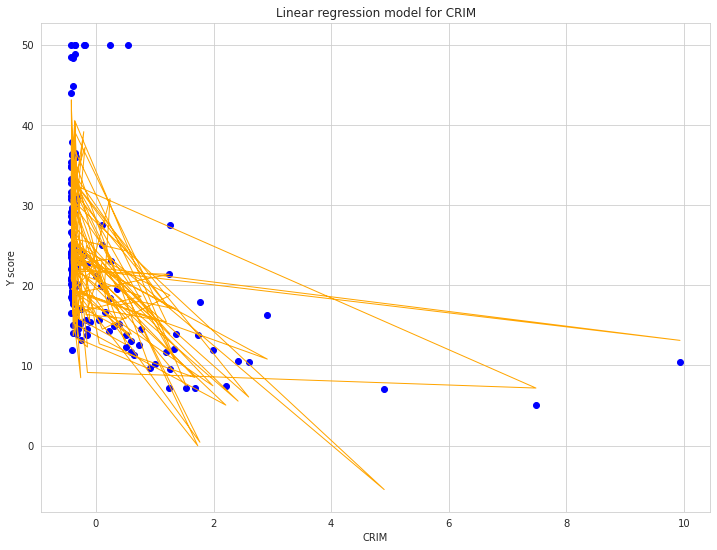

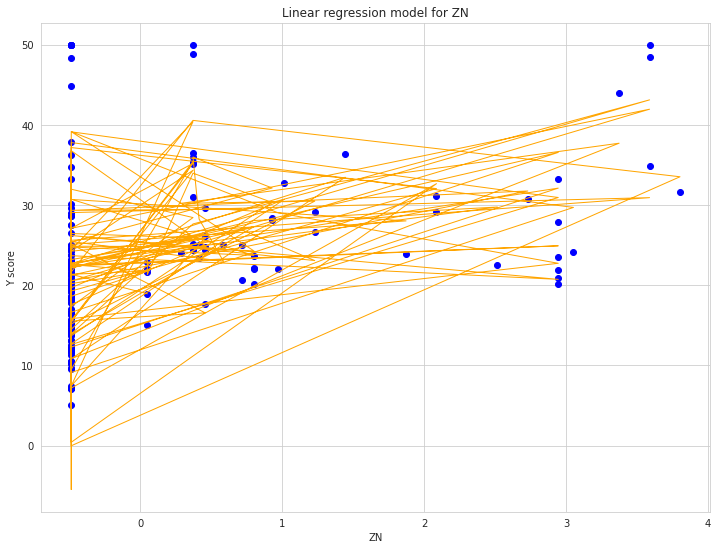

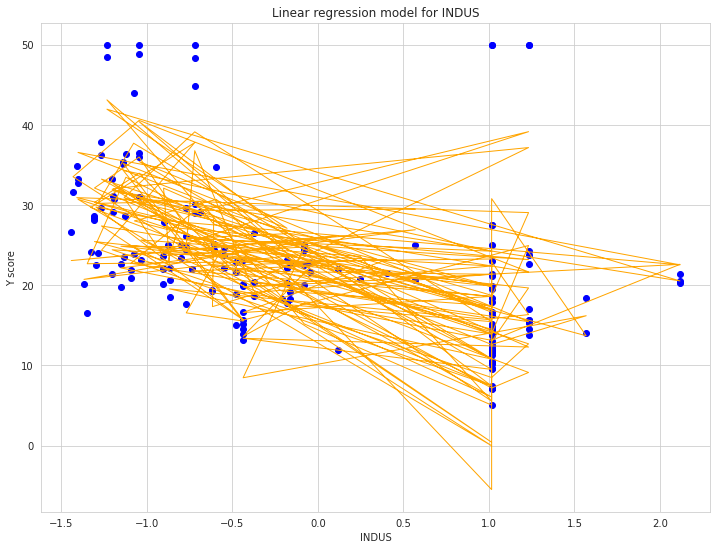

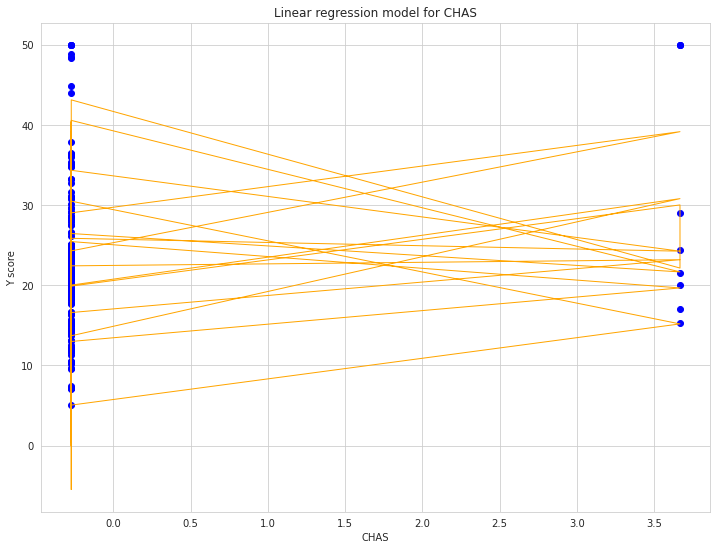

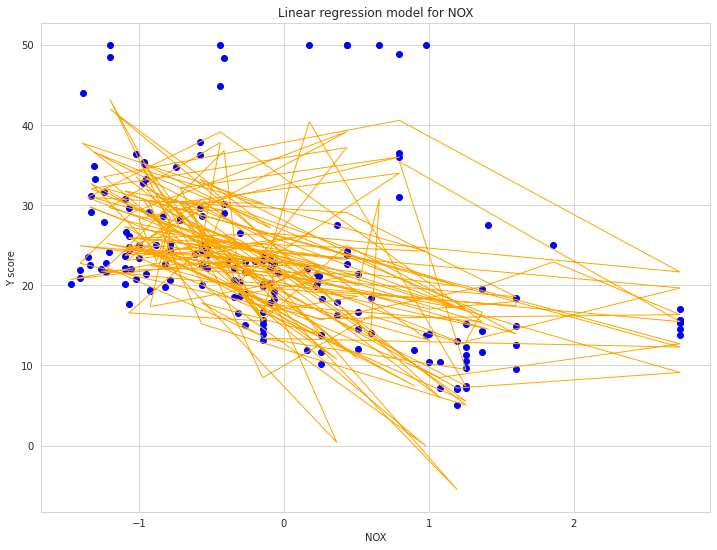

...

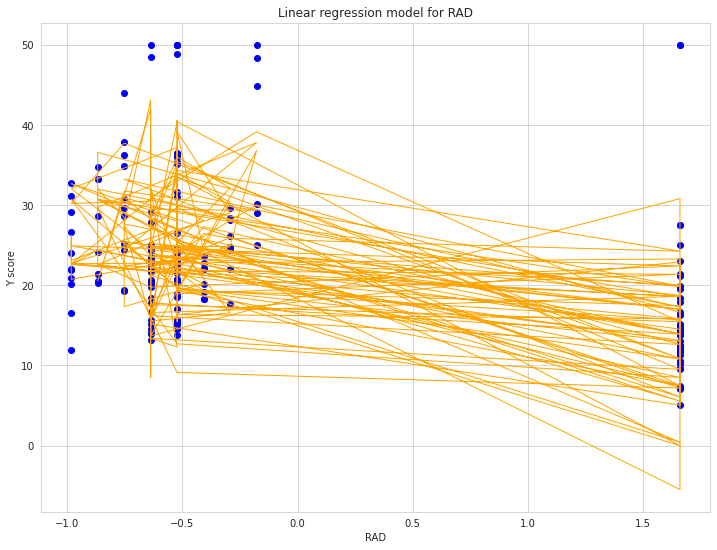

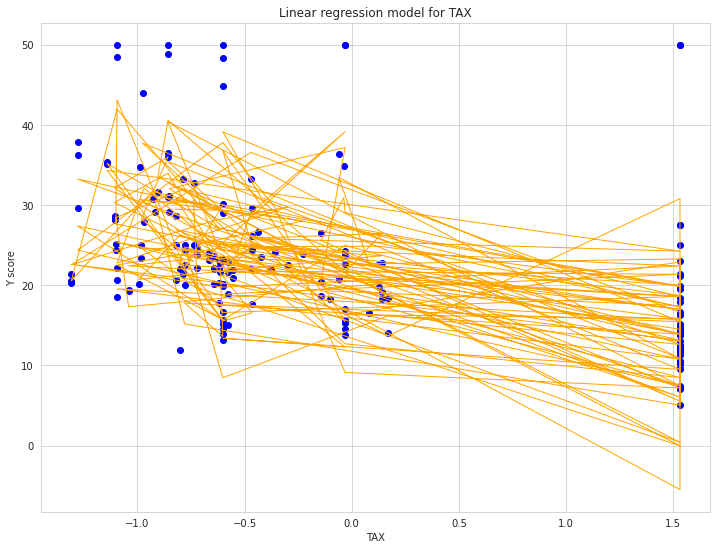

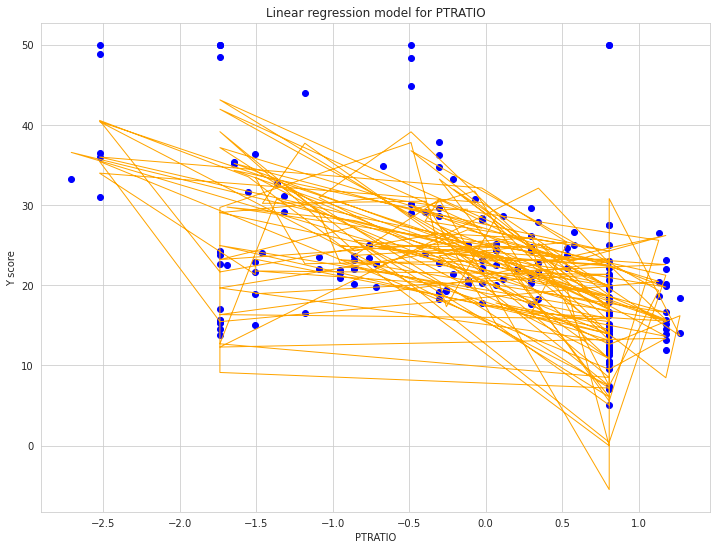

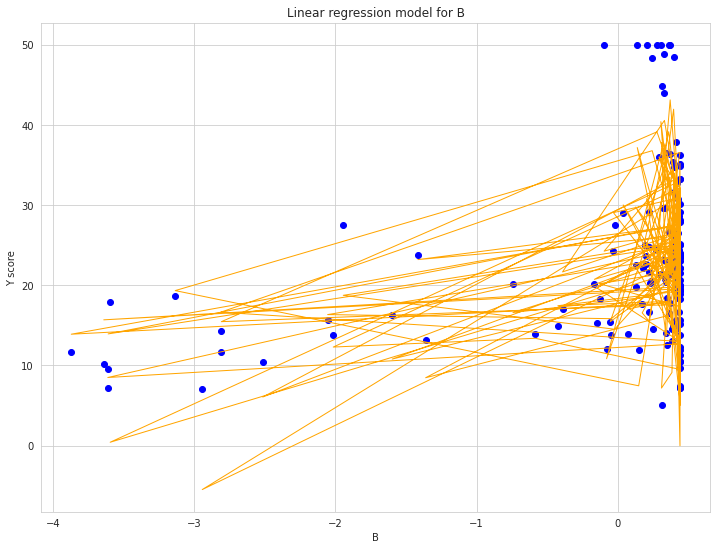

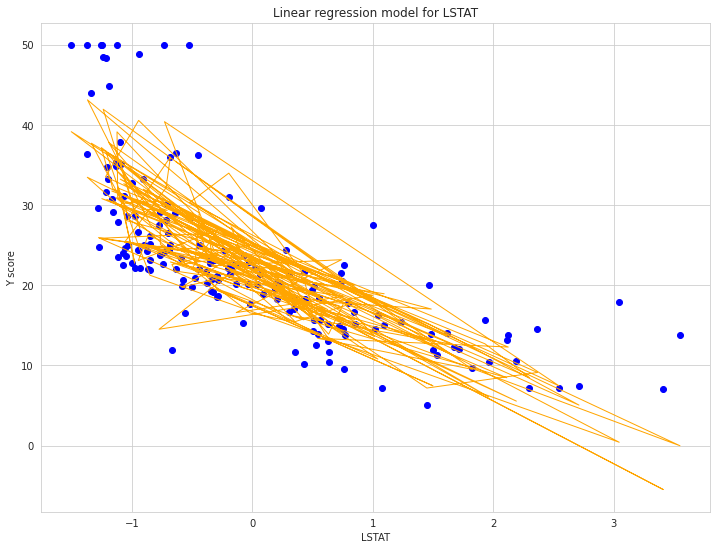

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
Parameter,,,,,,,,,,,,,
R2_score,0.132772,0.131641,0.212232,0.024449,0.160912,0.526474,0.092789,0.043528,0.144482,0.208016,0.239314,0.088940,0.504864
Explained_variance,0.147085,0.132695,0.212742,0.032247,0.163980,0.536933,0.094769,0.047302,0.147206,0.208563,0.239605,0.092578,0.507145
MSE,84.383617,84.493664,76.652023,94.923808,81.645536,46.075352,88.274086,93.067348,83.244230,77.062216,74.016799,88.648683,48.178042


In [142]:
all_var_lm(X, y, feature_names)

Among parameters, first of all, **not all** have association with *target* variable. 

We see, that regression is **noticable** only in the case of *LSTAT, PTRATIO, DIS, RM*. And a **slight regression** is also can be noticed for *NOX* and *AGE* parameters. However, the division on groups for mentioned parameters is not so obvious.

These parameters definetely **associated** with *target* distribution and depend on it. But the **LRM could not be used** here to **divide on exact groups**.

**Better division** is shown for *INDUS, CHAS, RAD, TAX*. We see how through target variable distributions these parameters are separated on two define clusters.

The rest of parameters - *CRIM, ZN, B* - are even **worse predicted by LRM** and show a **weak association** with target variable.

According to gained metrics features **RM** and **FSTAT** features are better for our model prediction based on Boston data. These features possess **better** *R2 score* and *MSE*, which means their appropriance for model training.

### Задание 3. Реализация логистической регресии (суммарно 10 баллов)

Логистическая регрессия не очень сильно отличается от обычной линейной регрессии и используется в задах классификации. Так как здесь мы снова будем пользоваться градиентным спуском, то нужно определить функцию потерь и ее градиент. Одним из самых популярных вариантов в задаче бинарной классификации является бинарная кросс-энтропия (BCE).

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

где $y$ это  таргет желаемого результата и $\hat y$ является выходом модели. $\sigma$ - это [*логистическая* функция](https://en.wikipedia.org/wiki/Sigmoid_function), который преобразует действительное число $\mathbb R$ в вероятность $[0,1]$.

Единственная проблема данной функции это возможность получить 0 под знаком логарифма, что не очень хорошо. Попробуем справить с этим "в лоб". Скажем, что наши предсказания могут принимать значения от 0 + eps до 1 - eps, где eps очень маленькое число.

#### Задание 3.1. Реализация сигмоиды (0.5 баллов)

Реализуйте функцию `sigmoid`, которая переводит действительное число $\mathbb R$ в вероятность $[0,1]$.

In [77]:
import math as mt
def sigmoid(output):
    # output результат X@w (-inf, +inf)
    return 1/(1+np.exp(-output))


#### Задание 3.2. BCE Loss и ее градиент (2.5 балла)

Так как мы с вами только начинаем изучать машинное обучение, то было бы слишком жестоко просить вас вычислить градиент BCE Loss (он не так сложен, просто нужно привыкнуть). Поэтому сразу напишем формулу для него:

$$
\nabla{\mathcal L_{BCE}(y, \hat y), X} = X^T (\sigma({\hat{y}}) - y)
$$

In [78]:
def bce(y_true, y_pred, eps=1e-15):
    """
    Функция потерь BCE.
        :param y_true: np.array[n_samples]: вектор из правильных ответов 0/1
        :param y_pred: np.array[n_samples]: вектор из предсказаний модели (вероятности)
        :return: значение функции потерь
    """
    
    if  y_true.shape[0] != y_pred.shape[0]:
        raise ValueError("Number of samples in both vectors should be equal")
        
    n = y_true.shape[0]
    
    # So I want escape log(0)
    y_pred = np.clip(y_pred, eps, 1 - eps)
    bce_l = 0
    for i in range(n):
        bce_l += abs(y_true[i]*mt.log(sigmoid(y_pred[i])) + (1-y_true[i])*mt.log(1-sigmoid(y_pred[i])))
    bce_l *= -1
    return bce_l

def bce_grad(y_true, y_pred, X):
    """
    Функция потерь BCE.
        :param y_true: np.array[n_samples]: вектор из правильных ответов 0/1
        :param y_pred: np.array[n_samples]: вектор из предсказаний модели (вероятности)
        :param X: np.array[n_samples, n_features]: матрица объекты x признаки
        :return: значение функции потерь
    """
    
    if  y_true.shape[0] != y_pred.shape[0]:
        raise ValueError("Number of samples in both vectors should be equal")
        
    return np.dot(np.matrix(X).T, (y_pred-y_true))


class BCELoss:
    """
    Класс, реализующий функцию потерь BCE. Нужен для того, чтобы
    объединять в одном месте функцию потерь и градиент для нее.
    """
    
    def __call__(self, y_true, y_pred):
        return bce(y_true, y_pred)
    
    def calculate_gradient(self, y_true, y_pred, X):
        return bce_grad(y_true, y_pred, X)

#### Задание 3.3. Предсказания логистической регрессии (2 балла)

Реализуйте метод `predict` у класса `CustomLogisticRegression`, не забудьте про свободный член!

In [79]:
class CustomLogisticRegression(BaseLinearModel):
    def __init__(self, learning_rate: float = 1e-3,
                 loss_function=BCELoss(), fit_intercept=True,
                 n_iter=1000, tol=1e-5, optimizer=BasicGradientDescent, grad_norm="l1"):
        
        super().__init__(learning_rate=learning_rate,
                         loss_function=loss_function, fit_intercept=fit_intercept,
                         n_iter=n_iter, tol=tol, optimizer=optimizer, grad_norm=grad_norm)
    
    
    def predict(self, X_test):
        # check if we estimated weights for our prediction
        if self.W is None:
            raise NotFittedError("This CustomLogisticRegression instance is not fitted, run fit method.")
        
        n_test_samples = X_test.shape[0]
        weights = np.zeros(X_test.shape[0])
        # intercept is necessary to make our data linearized
        if self.fit_intercept:
            ones_column = np.ones((n_test_samples, 1))
            X_test = np.hstack((ones_column, X_test))

        # way of LGR model appliance:
        # our normalized test data (processed by log) should be multiplied by weights
        # the prediction - sigmoid of the one mentioned as the previous point *|
        return sigmoid(X_test.dot( self.W )) 

    
    def __repr__(self):
        return "My custom logistic regression"

#### Снова проверим работу алгоритма на простом примере

In [80]:
# Создадим датасет из 1 признака и 2 классов
X, y = make_classification(n_features=1, n_informative=1,
                           n_redundant=0, n_clusters_per_class=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.33, random_state = 111)

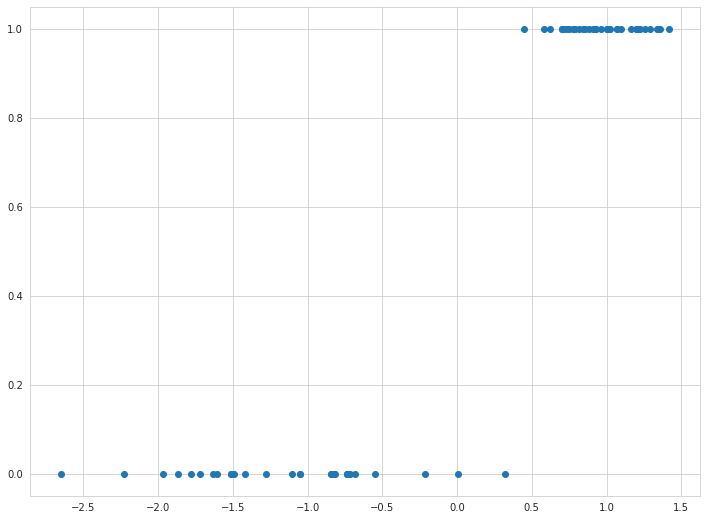

In [81]:
plt.scatter(X_train, y_train);

In [82]:
custom_log_reg = CustomLogisticRegression()
custom_log_reg.fit(X, y)
y_pred = custom_log_reg.predict(X_test)

array([[2.07718561e-03, 1.24442285e-02, 2.94801689e-03, 6.93024008e-06,
        4.46521573e-04, 3.65702934e-03, 9.64714463e-01, 9.53475652e-01,
        9.56497605e-01, 9.78393832e-01, 9.76020809e-01, 6.72636002e-03,
        3.51254762e-01, 4.50672528e-01, 9.82816068e-01, 2.94949645e-03,
        4.26067396e-04, 9.25234195e-01, 7.73573025e-04, 7.63871251e-04,
        9.28524434e-01, 9.79219409e-01, 2.40220543e-02, 9.78341339e-01,
        6.78679404e-01, 5.45221230e-03, 1.77588800e-01, 9.55392064e-01,
        9.97608425e-01, 1.67496977e-01, 5.47061705e-03, 1.83029393e-02,
        3.05742163e-03]])

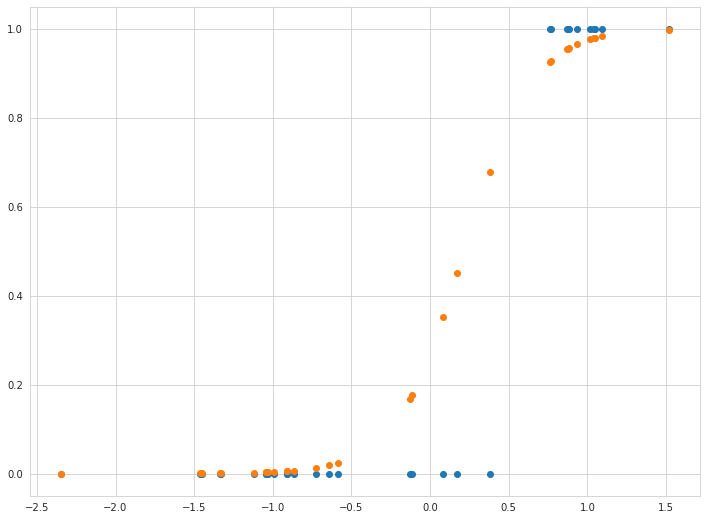

In [83]:
plt.scatter(X_test, y_test)
plt.scatter(X_test, y_pred);
y_pred.T

We see that with **simple data** our logistic regression model predicts the target value with **high accuracy**. However, it could be also noticed that when *emperical value (test X)* gets **closer to zero** - our model tendts to **decline** from the true target values. 

It could be because less specificity of logistic regression applying close to 0 values, which rised from *the form of LGR distribution* and *exponencial-dependent behaviour*.  

Проверьте качество работы модели при помощи известных вам метрик бинарной классификации.

In [84]:
# Evaluate quality of the model based on probabilities:
def acc_sc(y_pred, X_test):
    cor = 0
    l = len(X_test)
    approved = (y_pred > 0.5)
    
    # decrease dimension for availability of y_pred and y_test comparison (as y_pred - array of one-element list)
    test = y_test.reshape(-1, 1) 
    # find those, which equal to test ones
    cor = approved == test
    # count accuracy score in % format
    acc = (np.sum(cor) / l)*100
    return acc

print ('Accuracy of model in %: ', acc_sc(y_pred, X_test))



Accuracy of model in %:  96.96969696969697


As we can see, the accuracy of model seems to be **very high**, **~97%**. Indeed, as the chart tells us, we predict with high accuracy practically *all of the cases*. This signify about **high quality** of the model.

But if we check ODDs ration, how our prediction will cover the TP-to-FP space? For this - ROC-AUC is needed

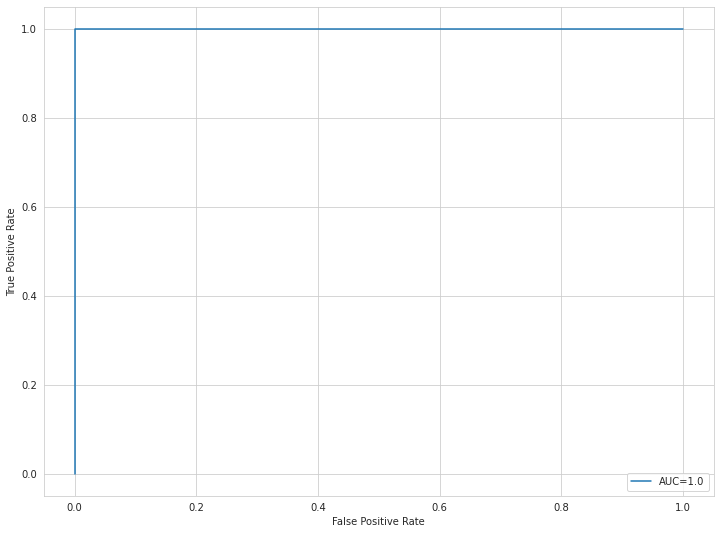

In [85]:
from sklearn import metrics #metriks module to build curves
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred) # convert pribabilities to TPR and FPR volumes

auc = metrics.roc_auc_score(y_test, y_pred) # estimate the space our predictions covers

#create ROC curve 
plt.plot(fpr,tpr,label="AUC="+str(auc))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

Our model shows high AUC score, which approves the proposition of a good model quality.

#### Задание 3.4. Применение логистической регрессии (5 баллов)

Мы будем использовать данные по свойствам покемонов (https://www.kaggle.com/abcsds/pokemon). В данном задании вам необходимо сначала сделать краткий EDA (Посмотреть на данные и их распределения, а также посмотреть, как различные признаки связаны между собой и с целевой переменной (`Legendary`)).

In [86]:
pokemon = pd.read_csv("Pokemon.csv", index_col = 0)
pokemon.head()
pokemon.isnull().sum()

# Remove NaN from array
pokemon = pokemon[~pokemon['Type 2'].isnull()]

# See our Types (unique elems):
pokemon['Type 1'].unique(), pokemon['Type 2'].unique()

# EDA
pokemon.describe().iloc[:,1:7]
pokemon

,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary
#,,,,,,,,,,,,
1,Bulbasaur,Grass,Poison,318,45,49,49,65,65,45,1,False
2,Ivysaur,Grass,Poison,405,60,62,63,80,80,60,1,False
3,Venusaur,Grass,Poison,525,80,82,83,100,100,80,1,False
3,VenusaurMega Venusaur,Grass,Poison,625,80,100,123,122,120,80,1,False
6,Charizard,Fire,Flying,534,78,84,78,109,85,100,1,False
...,...,...,...,...,...,...,...,...,...,...,...,...
719,Diancie,Rock,Fairy,600,50,100,150,100,150,50,6,True
719,DiancieMega Diancie,Rock,Fairy,700,50,160,110,160,110,110,6,True
720,HoopaHoopa Confined,Psychic,Ghost,600,80,110,60,150,130,70,6,True


Here we see that our features not balanced. Even majority has prettu equal std and mean values, some (e.g. Sp.Def, Speed and HP) possess lower ones. 

In [87]:
# Anayze correlation between feature and Legendary variable

pokemon.groupby('Legendary').corr()[::-9]


,,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation
Legendary,,,,,,,,,
True,Generation,-0.168684,-0.111196,0.072201,-0.046516,-0.011992,-0.153747,-0.336051,1.000000
False,Speed,0.504628,0.185740,0.342917,-0.093893,0.363526,0.129287,1.000000,0.016416


Here several things can be noticed:
1. Legendary Pokemons have negative correlation with HP: more legendary they are, less HP they have.
2. Non-legendary pokemons possess higher positive corelation rates with HP, Attack, Speed and Sp.Atk.
3. Legendary Pokemons in average seem to have tendency of decrease of all parameters.
4. Non-legendary pokemons show lower rates of defence they could bring.

In [88]:
# Prepare data for grouped pairplot visualization - to estimate the correlation between features and legendary
pok_plot = pokemon.reset_index().drop(columns = ['#','Generation', 'Name', 'Type 1', 'Type 2', 'Total'])
pok_plot


,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Legendary
0,45,49,49,65,65,45,False
1,60,62,63,80,80,60,False
2,80,82,83,100,100,80,False
3,80,100,123,122,120,80,False
4,78,84,78,109,85,100,False
...,...,...,...,...,...,...,...
409,50,100,150,100,150,50,True
410,50,160,110,160,110,110,True
411,80,110,60,150,130,70,True
412,80,160,60,170,130,80,True


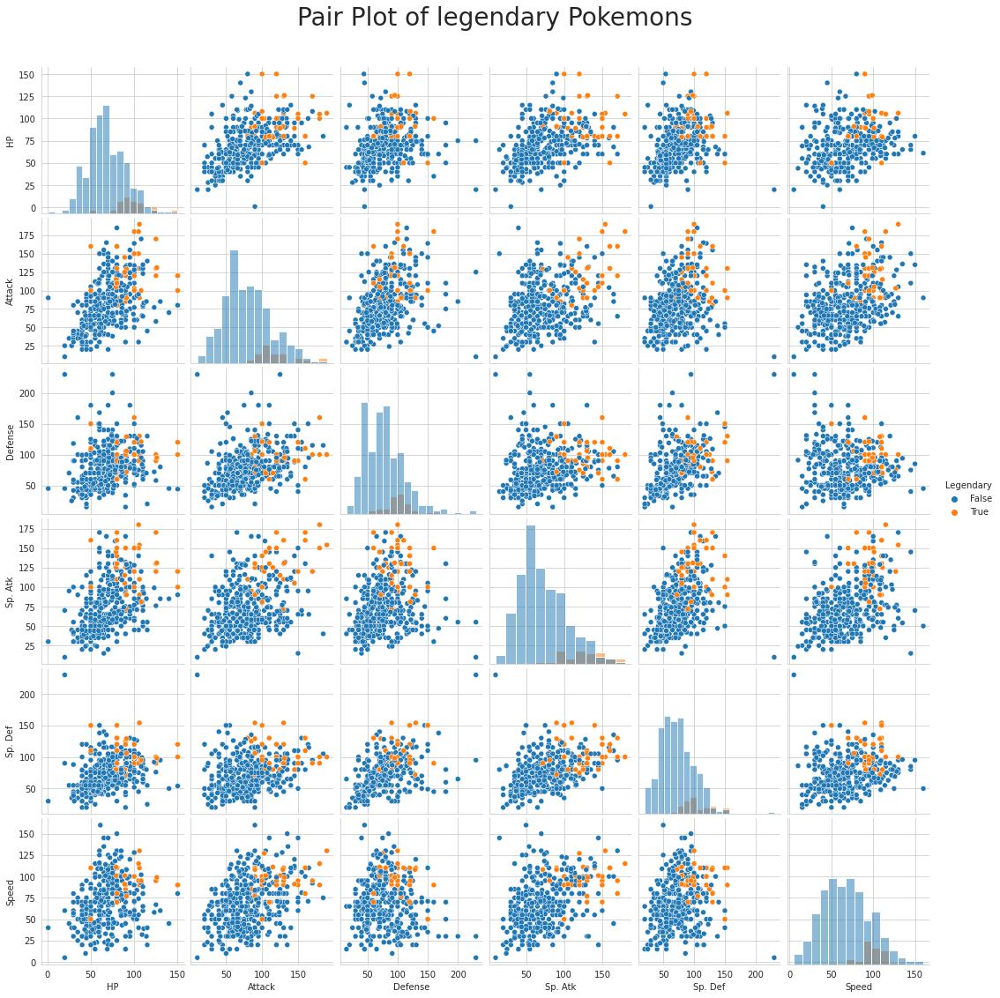

In [89]:
sns.pairplot(data = pok_plot, hue = 'Legendary', diag_kind = 'hist')
plt.suptitle('Pair Plot of legendary Pokemons', size = 28, y = 1.05);

Мы будем предсказывать является ли покемон легендарным или нет. Замените логическое значение колонки на числовое (перекодировав на 0 и 1). Также подумайте, как в этом случае лучше закодировать категориальные признаки (может быть, лучше их просто выбросить?).

In [90]:
# Replace categorical legendary variables by [0,1] values:

pokemon.Legendary = pd.get_dummies(pokemon.Legendary)[1]

# Drop Type variables - not necessary for the analysis (if only combinatorical sense present)

pok_log = pokemon.reset_index().drop(columns = ['#', 'Name','Type 1', 'Type 2'])
pok_log

,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary
0,318,45,49,49,65,65,45,1,0
1,405,60,62,63,80,80,60,1,0
2,525,80,82,83,100,100,80,1,0
3,625,80,100,123,122,120,80,1,0
4,534,78,84,78,109,85,100,1,0
...,...,...,...,...,...,...,...,...,...
409,600,50,100,150,100,150,50,6,1
410,700,50,160,110,160,110,110,6,1
411,600,80,110,60,150,130,70,6,1
412,680,80,160,60,170,130,80,6,1


Разделите ваши данные на тестовую и тренировочную выборку.

In [91]:
# Make preferable format
X, y = np.array(pok_log.iloc[:,0:8]), np.array(np.matrix(pok_log.iloc[:,8:10]).T).reshape(-1)
X, y
Xpok_tr, Xpok_tst, ypok_tr, ypok_tst = train_test_split(X, y, test_size = 0.33, random_state = 111)
# As our variables are not balanced and their distributions differ, the standartization ought to be applied
Xpok_tr, Xpok_tst = scaler.fit_transform(Xpok_tr), scaler.fit_transform(Xpok_tst)

Обучите модель `LogisticRegression` из `sklearn`.

In [92]:
lrm_pok = LogisticRegression()
lrm_pok.fit(Xpok_tr, ypok_tr)
ypok_pred = lrm_pok.predict(Xpok_tst)


Выведите метрики вашего классификатора:

1. Нарисуйте [confusion matrix](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.plot_confusion_matrix.html).

2. Изобразите ROC кривую и посчитайте площадь под ней.

3. Скажите, какие признаки оказались наиболее важны для модели.

Text(0.5, 1.0, 'Confusion matrix of estimator')

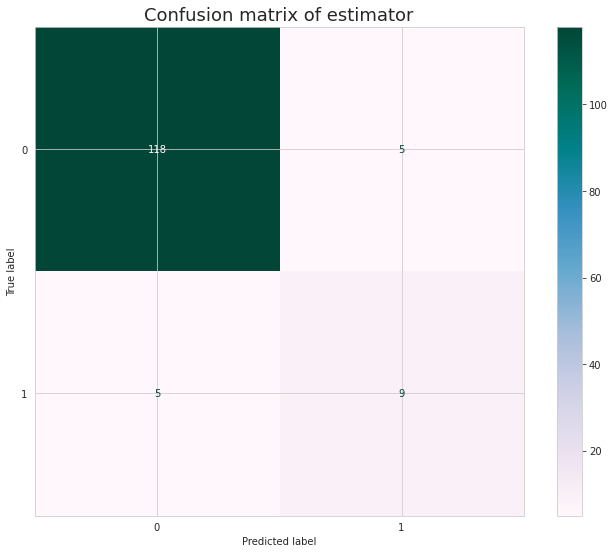

In [93]:
from sklearn.metrics import ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_estimator(lrm_pok, Xpok_tst, ypok_tst, cmap = 'PuBuGn')
plt.title('Confusion matrix of estimator', size = 18)

Text(0.5, 1.0, 'Confustion matrix of predicted legendary')

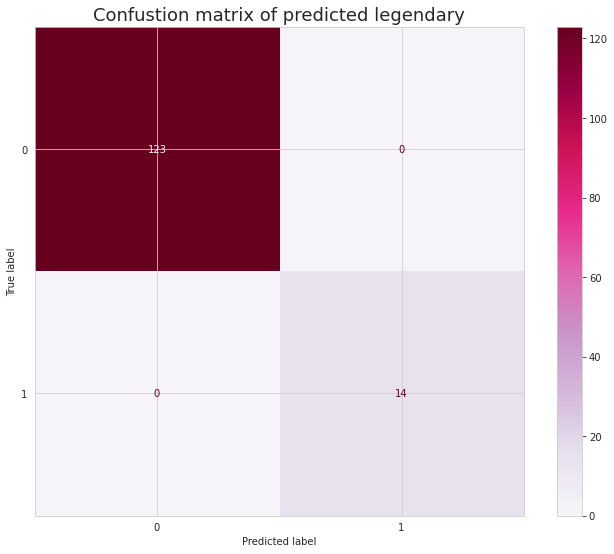

In [94]:
ConfusionMatrixDisplay.from_estimator(lrm_pok, Xpok_tst, ypok_pred, cmap = 'PuRd')
plt.title('Confustion matrix of predicted legendary', size = 18)

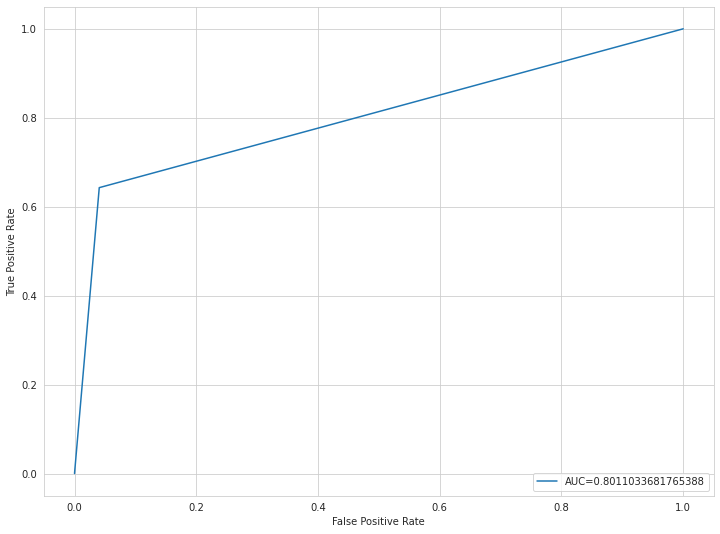

In [95]:
fpr, tpr, _ = metrics.roc_curve(ypok_tst,  ypok_pred) # convert pribabilities to TPR and FPR volumes

auc = metrics.roc_auc_score(ypok_tst, ypok_pred) # estimate the space our predictions covers

#create ROC curve 
plt.plot(fpr,tpr,label="AUC="+str(auc))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

It seems that our model was **overtaught**. It better predicts values for *test set*, than recognizes the default ones. If among *test sets* **legendary target** was showing **FP** and **FN** predictions, in the case of **predicted sets** they were *correctly divided* among **TP** and **FP** predictions. This signifies about **high accuracy** but **low specificity** of the model. However, as the accuracy still close to 1.0 (according to ROC-AUC result), we can admit a **proper quality** of the model.

But which feature mostly contribute?

In [96]:
# Check coefficients of the model (indicies of coefficients reflects the order of feature in the array)

print(f'The most significant contribution was shown for {pok_log.columns[np.argmax(lrm_pok.coef_ )]}.')

print(f'And {pok_log.columns[np.where(lrm_pok.coef_ > 1)[1]][0]}, \
{pok_log.columns[np.where(lrm_pok.coef_ > 1)[1]][1]}, \
{pok_log.columns[np.where(lrm_pok.coef_ > 1)[1]][2]} all had coefficients higher than 1.0.')


The most significant contribution was shown for Sp. Def.
And Total, Sp. Atk, Sp. Def all had coefficients higher than 1.0.


### Задание 4. Расскажите о вашей любимой музыкальной группе (исполнителе) (0.5 балла)

Расскажите, как вы познакомились с этой группой и скиньте несколько наиболее любимых треков)

Если говорить о коллективах, то мне больше по душе инди-рок, альтернатива. Соответственно, Imagine Dragons, Coldplay. Но это достаточно распротраненный сет.
Очень нравитс LP (даже должна была идти на концерт, но он перенесен) и из русских - The Hatters (первые альбомы), Мвзагреби. Две последние нравятся необычной гармоникой и сложностью партитур.

Однако отдельное место в сердце занимает японская музыка. Мне не нравятся распространенные K-POP, J-POP в именно мейнстримном варианте. Но есть любимые исполнительницы: yanaginagi, Eir Aoi, Nana Mizuki. Но последний список я могу перечислять долго :)
        
Основная проблема еще в том, что я могу запомнить мелодию, отложить в памяти, но название группы и песни сложно запоминаю.

## Therapy time

Напишите здесь ваши впечатления о задании: было ли интересно, было ли слишком легко или наоборот сложно и тд. Также сюда можно написать свои идеи по улучшению заданий, а также предложить данные, на основе которых вы бы хотели построить следующие дз. 

**Ваши мысли:**